# 11. Yerevan Smart City Sensing - Final Project. Part II

## Urban sensing: quantifying the sensing power of vehicle fleets. Part II

In this part of the project, we will build on what we did in the first part, and will present the results with an animated visualisation.

<img src="Yerevan_sensing_power.gif" width="1000" align="center">

In [1]:
#!pip install ipython-autotime
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx

time: 3.48 s (started: 2021-09-26 21:54:12 +01:00)


Let's load the Yerevan street network data we saved in the first part of the project.

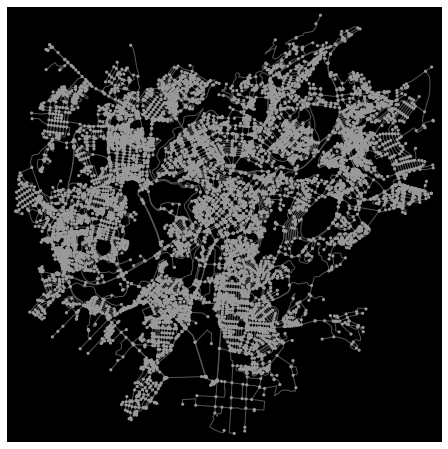

time: 2.66 s (started: 2021-09-26 21:54:16 +01:00)


In [2]:
yerevan_subgraph = nx.read_gpickle("Yerevan_graph.gpickle")
fig, ax = ox.plot_graph(yerevan_subgraph, bgcolor='k', node_size=10, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1, edge_alpha=1)

## Computing the fractions $\langle C\rangle$ from the simulated data

Let's also load the data containing the trips we simulated in the taxi-drive process we did in the first part of the project.

In [3]:
simulated_trips_dict = np.load('Yerevan_simulated_trips.npy', allow_pickle=True).item()
simulated_trips_dict

{1: [2954854772,
  2954854770,
  3828547535,
  406359731,
  3828547507,
  406387623,
  311002325,
  311001864,
  4732602804,
  3828505676,
  3828505675,
  4181757574,
  1796426893,
  311004476,
  407729585,
  311004633,
  310996709,
  7409804394,
  310998414,
  4110471431,
  962312802,
  962311984,
  962312180,
  4823522691,
  4823522690,
  311047638,
  3824803073,
  332046267,
  283681170,
  311028336,
  630826429,
  5037605621,
  4380541586,
  2139371200,
  4380541587,
  4380514831,
  1141147225,
  293020744,
  718001654,
  718001698,
  718001611,
  718001618,
  718001612,
  2258015600,
  718001557,
  718001559,
  1342591727,
  3793136791,
  1618843656,
  2940170491,
  2940170492],
 2: [2940170492,
  2940170491,
  1618843656,
  3793136791,
  1342591727,
  718001559,
  718001557,
  2258015600,
  718001612,
  718001618,
  718001611,
  718001698,
  718001654,
  293020744,
  1141147225,
  4380514831,
  4380541587,
  1141015960,
  2258015513,
  2258015484,
  4380541585,
  1332754911,
  50

time: 1.41 s (started: 2021-09-26 21:54:18 +01:00)


In [4]:
from tqdm import tqdm

# initialise dictionary to collect the street network edges for each trip in the simulation
sim_trip_edges = {}
for key, route in tqdm(simulated_trips_dict.items()):
    # create list of edges from list of nodes in the trip
    edges = [ tuple( route[i:i+2] ) for i in range( len(route) - 1 ) ]
    # add to dictionary
    sim_trip_edges[key] = edges
    
sim_trip_edges

100%|███████████████████████████████████████████████████████████████████████| 57583/57583 [00:00<00:00, 57616.42it/s]


{1: [(2954854772, 2954854770),
  (2954854770, 3828547535),
  (3828547535, 406359731),
  (406359731, 3828547507),
  (3828547507, 406387623),
  (406387623, 311002325),
  (311002325, 311001864),
  (311001864, 4732602804),
  (4732602804, 3828505676),
  (3828505676, 3828505675),
  (3828505675, 4181757574),
  (4181757574, 1796426893),
  (1796426893, 311004476),
  (311004476, 407729585),
  (407729585, 311004633),
  (311004633, 310996709),
  (310996709, 7409804394),
  (7409804394, 310998414),
  (310998414, 4110471431),
  (4110471431, 962312802),
  (962312802, 962311984),
  (962311984, 962312180),
  (962312180, 4823522691),
  (4823522691, 4823522690),
  (4823522690, 311047638),
  (311047638, 3824803073),
  (3824803073, 332046267),
  (332046267, 283681170),
  (283681170, 311028336),
  (311028336, 630826429),
  (630826429, 5037605621),
  (5037605621, 4380541586),
  (4380541586, 2139371200),
  (2139371200, 4380541587),
  (4380541587, 4380514831),
  (4380514831, 1141147225),
  (1141147225, 29302074

time: 4.09 s (started: 2021-09-26 21:54:20 +01:00)


For visualisation purposes, let's plot the fractions obtained from the simulation at certain points:

In [5]:
trips = [2, 100, 300, 600, 1000, 1500, 2200, 3000, 4000, 5400,
                 6700,9100,12000, 15500, 20000, 25000,30000,36000,42500,50000,57583]

# create list containing the lists of nodes of the trips
trips_list = list(simulated_trips_dict.values())

time: 0 ns (started: 2021-09-26 21:54:24 +01:00)


In [6]:
# create list containing the lists of streets covered in each trip
street_list = list(sim_trip_edges.values())
street_list[:2]

[[(2954854772, 2954854770),
  (2954854770, 3828547535),
  (3828547535, 406359731),
  (406359731, 3828547507),
  (3828547507, 406387623),
  (406387623, 311002325),
  (311002325, 311001864),
  (311001864, 4732602804),
  (4732602804, 3828505676),
  (3828505676, 3828505675),
  (3828505675, 4181757574),
  (4181757574, 1796426893),
  (1796426893, 311004476),
  (311004476, 407729585),
  (407729585, 311004633),
  (311004633, 310996709),
  (310996709, 7409804394),
  (7409804394, 310998414),
  (310998414, 4110471431),
  (4110471431, 962312802),
  (962312802, 962311984),
  (962311984, 962312180),
  (962312180, 4823522691),
  (4823522691, 4823522690),
  (4823522690, 311047638),
  (311047638, 3824803073),
  (3824803073, 332046267),
  (332046267, 283681170),
  (283681170, 311028336),
  (311028336, 630826429),
  (630826429, 5037605621),
  (5037605621, 4380541586),
  (4380541586, 2139371200),
  (2139371200, 4380541587),
  (4380541587, 4380514831),
  (4380514831, 1141147225),
  (1141147225, 293020744),

time: 15 ms (started: 2021-09-26 21:54:24 +01:00)


In [7]:
# initialise the lists containing the nodes and edges of the Yerevan street network, respectively
yerevan_nodes = list(yerevan_subgraph.nodes())
yerevan_streets = list(yerevan_subgraph.edges())
yerevan_streets[:10]

[(130040577, 1317612052),
 (130040577, 3790541209),
 (130040577, 633212448),
 (130040577, 3791497733),
 (130040637, 2293592960),
 (130040637, 597695297),
 (130040637, 292950217),
 (256031240, 3957348958),
 (256031240, 4458309738),
 (256031240, 7658616838)]

time: 62 ms (started: 2021-09-26 21:54:24 +01:00)


Now, we are ready to compute the fractions covered by a given number of trips in the simulation.

100%|████████████████████████████████████████████████████████████████████████████████| 21/21 [01:34<00:00,  4.50s/it]


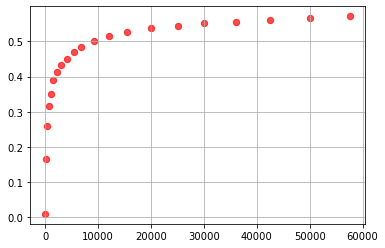

time: 1min 34s (started: 2021-09-26 21:54:24 +01:00)


In [8]:
# initialise empty list to collect the fractions for each number of trips in the trips list defined above
fracs = []

# loop over the trips, compute the fraction of the street network covered, and append to list
for trip in tqdm(trips):
    # take the street lists of trips up to trip in current iteration
    routes = street_list[:trip]
    # flatten list and take the set to make sure getting rid of repeating streets
    routes_set = set([item for sublist in routes for item in sublist])
    # we need to also solve the problem streets counted twice due to reverse tuples
    routes_clean = []
    for pair in routes_set:
        if pair not in routes_clean and pair[::-1] not in routes_clean:
            routes_clean.append(pair)
    # compute the fraction and add to list
    fracs.append(len(routes_clean)/len(yerevan_streets))
    
# plot    
plt.scatter(trips, fracs, s=40, alpha=0.7, c='r')
plt.grid()
plt.show()

## Plotting the taxi-drive process on the street network

Now, let's prepare the data to plot the street network with the street edge thicknesses proportional to the number of times those streets were visited during the taxi-drive process simulation.

To get the correct counts for each street, we need to get rid of the reverse tuples first. An elegant solution is by converting the tuples to lists, sorting them and converting back to tuples.

Let's see this with a toy example:

In [9]:
x = [(1,2), (1,2), (2,3), (3,2), (2,1), (1,2), (2,6), (6,2)]
def sort_tuples(alistoftuples):
    '''
    This function takes as input a list of tuples, converts the tuples in it to lists, 
    sorts them and converts back to tuples, returning a list of correctly ordered tuples
    '''
    return [tuple(sorted(k)) for k in alistoftuples]

sort_tuples(x)

[(1, 2), (1, 2), (2, 3), (2, 3), (1, 2), (1, 2), (2, 6), (2, 6)]

time: 15 ms (started: 2021-09-26 21:55:59 +01:00)


Now, let's apply this function to our list of streets, and then let's create a dictionary with the street segment counts:

In [10]:
streets_list = [item for sublist in street_list for item in sublist]
streets_list_corr = sort_tuples(streets_list)

from collections import Counter
street_counts = dict(Counter(streets_list_corr))
street_counts

{(2954854770, 2954854772): 1649,
 (2954854770, 3828547535): 1551,
 (406359731, 3828547535): 1817,
 (406359731, 3828547507): 2409,
 (406387623, 3828547507): 2412,
 (311002325, 406387623): 2398,
 (311001864, 311002325): 2362,
 (311001864, 4732602804): 3407,
 (3828505676, 4732602804): 3837,
 (3828505675, 3828505676): 7284,
 (3828505675, 4181757574): 3982,
 (1796426893, 4181757574): 3871,
 (311004476, 1796426893): 3740,
 (311004476, 407729585): 3145,
 (311004633, 407729585): 3136,
 (310996709, 311004633): 3098,
 (310996709, 7409804394): 1488,
 (310998414, 7409804394): 1496,
 (310998414, 4110471431): 1430,
 (962312802, 4110471431): 1427,
 (962311984, 962312802): 1327,
 (962311984, 962312180): 1431,
 (962312180, 4823522691): 1312,
 (4823522690, 4823522691): 1235,
 (311047638, 4823522690): 1094,
 (311047638, 3824803073): 1016,
 (332046267, 3824803073): 1303,
 (283681170, 332046267): 938,
 (283681170, 311028336): 971,
 (311028336, 630826429): 1135,
 (630826429, 5037605621): 1085,
 (4380541586,

time: 2.11 s (started: 2021-09-26 21:55:59 +01:00)


Let's plot a quick and dirty histogram:

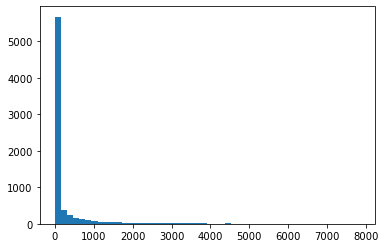

time: 328 ms (started: 2021-09-26 21:56:01 +01:00)


In [11]:
plt.hist(street_counts.values(), bins=50)
plt.show()

Finally, in order to assign a correct edge thickness to the streets in the Yerevan street network, we need to make sure that the tuples representing streets in the street count dictionary correspond to those in the street network edge data, and are not reversed:

In [12]:
# initialise empty dictionary to collect the edge thicknesses
edge_thickness = []
# loop over streets in the Yerevan street network
for street in tqdm(yerevan_streets):
    # check if the tuple representing that street is present in the street count dictionary
    if street in street_counts: 
        edge_thickness.append(street_counts[street])
    # if not, check whether the reversed tuple is present
    elif street[::-1] in street_counts:
        edge_thickness.append(street_counts[street[::-1]])
    # if none of them are present, assign a thickness of 1
    else:
        edge_thickness.append(1)
edge_thickness = np.array(edge_thickness)
edge_thickness

100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 798444.47it/s]


array([   2,  126, 2192, ...,    1,    6,   13])

time: 16 ms (started: 2021-09-26 21:56:01 +01:00)


Having created the `edge_thickness` array, let's plot the Yerevan street network:

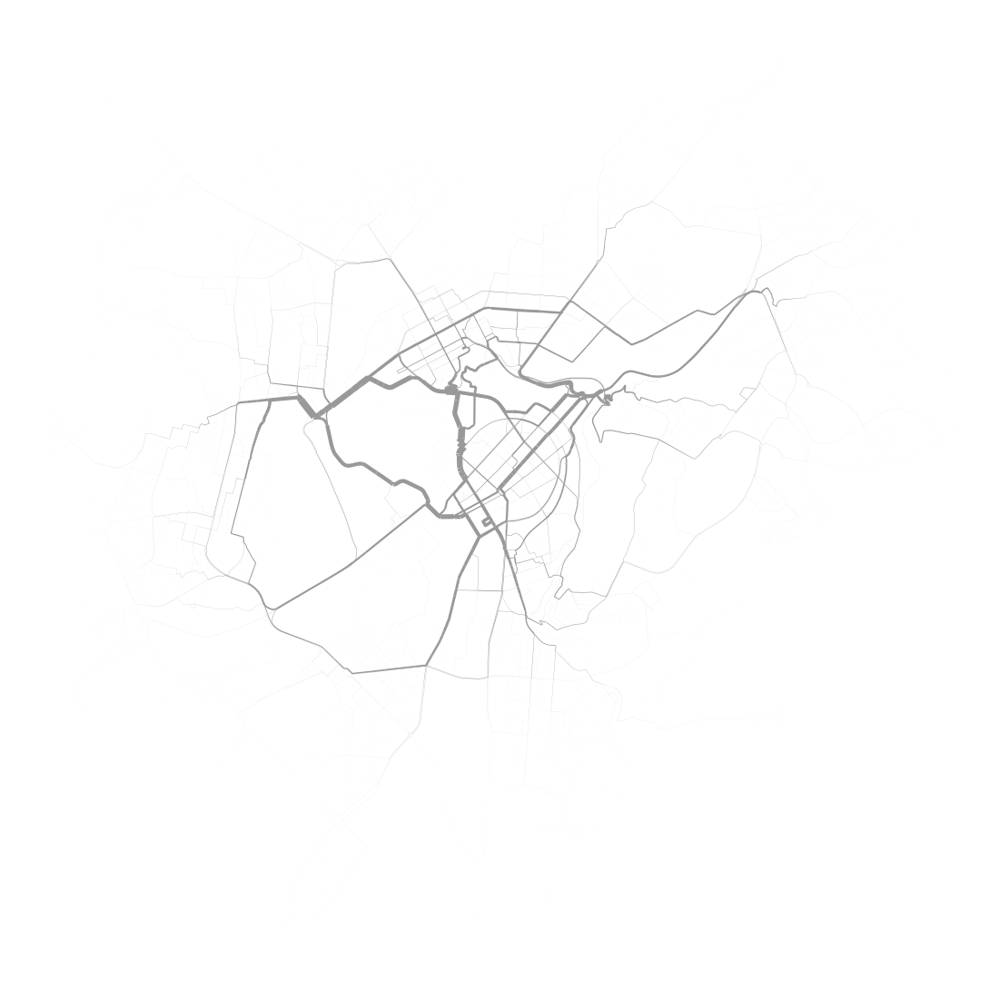

<Figure size 432x288 with 0 Axes>

time: 2.23 s (started: 2021-09-26 21:56:01 +01:00)


In [13]:
fig, ax = ox.plot_graph(
    yerevan_subgraph,
    figsize=(20,20),
    node_color='grey',
    node_size=0,
    bgcolor='white',
    node_alpha=0.8,
    edge_linewidth=edge_thickness/1000,
    edge_color="#999999",
)
plt.tight_layout()
plt.show()

## Creating the animated spatial visualisation

Before we create the animated spatial visualisation of the fraction of streets covered by different amount of taxi trips in the city, we have to define a plot function that will create a plot for each time frame in the animation:

In [14]:
def plot_(graph, figsize=(20,20), node_size=0,
                                  bgcolor='white',
                                  edge_linewidth=0.5,
                                  edge_alpha=0.7,
                                  edge_color="#999999"):
    
    ''' 
    This function takes as input the graph to be plotted, and the following parameters:
    
    node_size: the size of the network nodes, float
    bgcolor: the background color of the overall plot
    edge_linewidth: the thickness of the network edges, float or list
    edge_alpha: edge transparency
    edge_color: color of network edges
    
    and returns a plot of the network with the given parameters
    
    '''
    
    fig, ax = ox.plot_graph(graph,
                            figsize=(20,20),
                            node_size=0,
                            bgcolor='white',
                            edge_linewidth=0.5,
                            edge_alpha=0.7,
                            edge_color="#999999", 
                            show=False, close=False)
    
    ox.plot_graph(graph, 
                  ax = ax,
                  figsize=(20,20),
                  node_size=0,
                  bgcolor='white',
                  edge_linewidth=edge_thickness/1000,
                  edge_alpha=0.8,
                  edge_color="r", 
                  show=False, close=False)
    
    # add scalebar
    scalebar = ScaleBar(75000, location='lower left',color = 'silver',
                        box_alpha=0.5, box_color='whitesmoke') # 1 pixel = 0.5 meter
    plt.gca().add_artist(scalebar)
    
    # set plot title
    ax.set_title('Street fraction covered by {} trips in Yerevan'.format(trip), \
                 fontsize=20, alpha=0.7, color='darkslategrey')
    
    # create inset axes
    inset_ax = fig.add_axes([.69, .2, .2, .15])
    
    # make inset transparent
    inset_ax.patch.set_alpha(0.55)
    
    # add the fraction C plot to inset axes
    inset_ax.plot(trips[:n+1], fracs[:n+1], color='red', linestyle='--', marker='o', 
                       markersize=2.5, linewidth=1.3, alpha=0.7, clip_on=False)
    inset_ax.scatter(trips[n], fracs[n], color='red', s=50, alpha=0.55, clip_on=False)
    
    # set x and y limits
    inset_ax.set_xlim(-100,trips[-1])
    inset_ax.set_ylim(0,0.7)
    
    #set x and y labels
    inset_ax.set_xlabel('Number of trips', fontsize= 14, alpha=0.85, color='darkslategrey')
    inset_ax.set_ylabel('Fraction covered', fontsize= 14, alpha=0.85, color='darkslategrey')
    
    # get rid of spines of the inset plot
    inset_ax.spines['right'].set_visible(False)
    inset_ax.spines['top'].set_visible(False)
    inset_ax.spines['left'].set_visible(False)
    inset_ax.spines['bottom'].set_visible(False)
    
    # make ticks external on y axis
    inset_ax.yaxis.set_ticks_position('left')
    
    # set tick colors
    inset_ax.tick_params(axis='x', colors='slategrey')
    inset_ax.tick_params(axis='y', colors='slategrey')
    
    # add background grid
    inset_ax.grid(alpha=0.4)
    
    # save and show plot
    plt.savefig('../Notebooks/plots/Urban Sensing/Yerevan_coverage_{}.jpg'.format(n+1), dpi=90)
    plt.show()

time: 16 ms (started: 2021-09-26 21:56:04 +01:00)


Now we are ready to create the animated spatial visualisation of the fractions $\langle C\rangle$ for different amounts of trips of the taxi-drive process simulation:

0it [00:00, ?it/s]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 911286.91it/s]


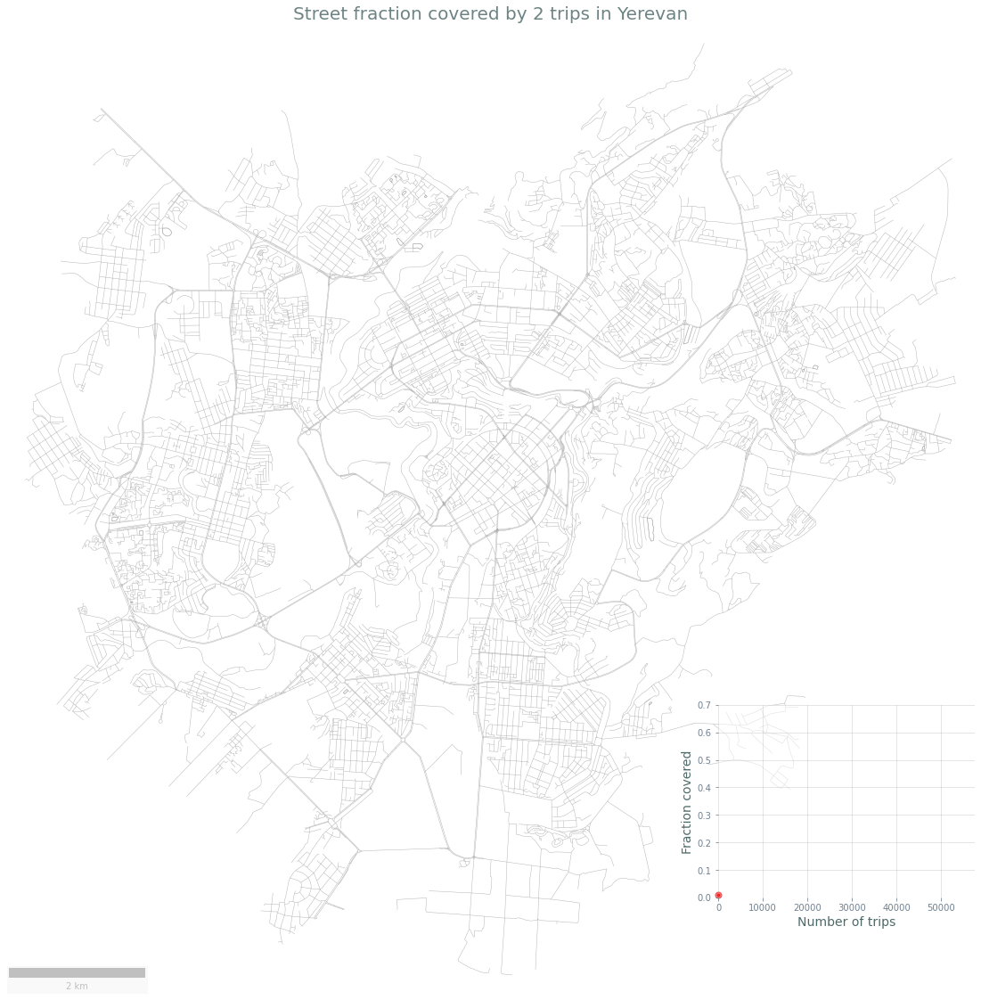

1it [00:05,  5.40s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 851615.69it/s]


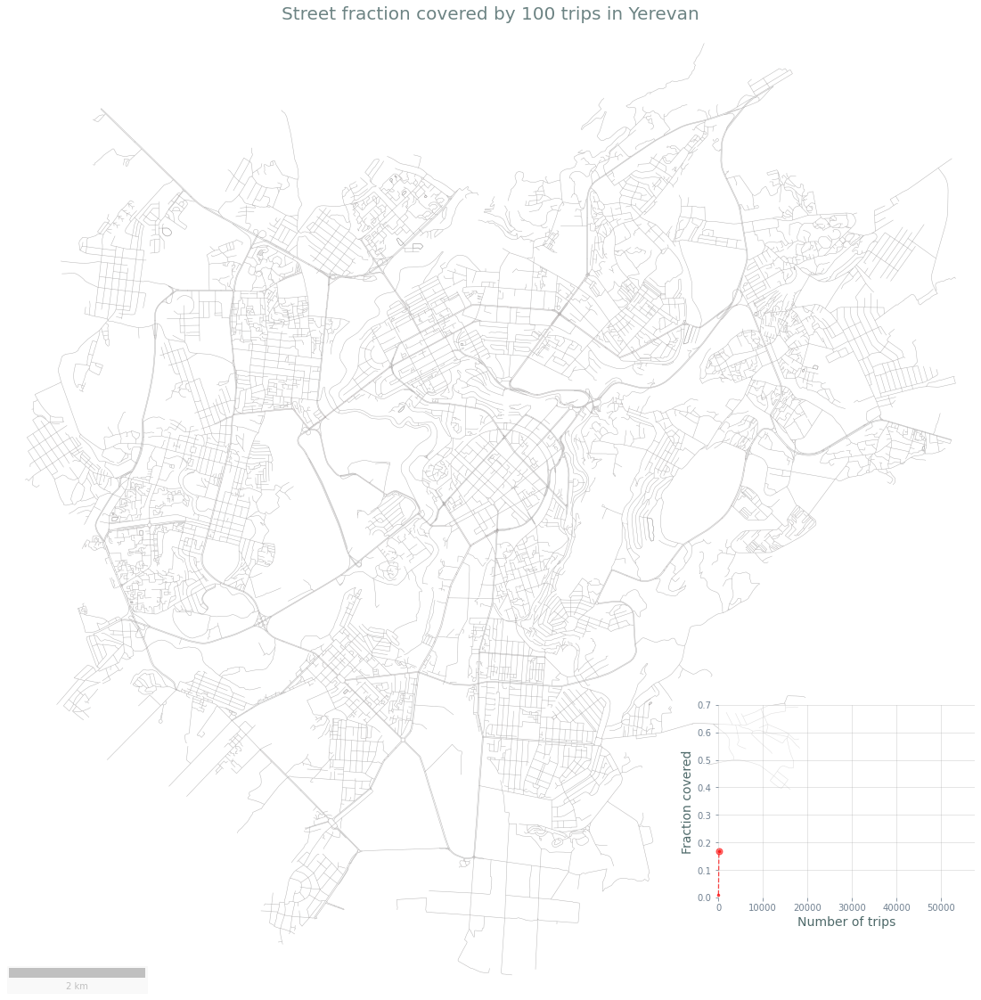

2it [00:11,  5.78s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 817123.75it/s]


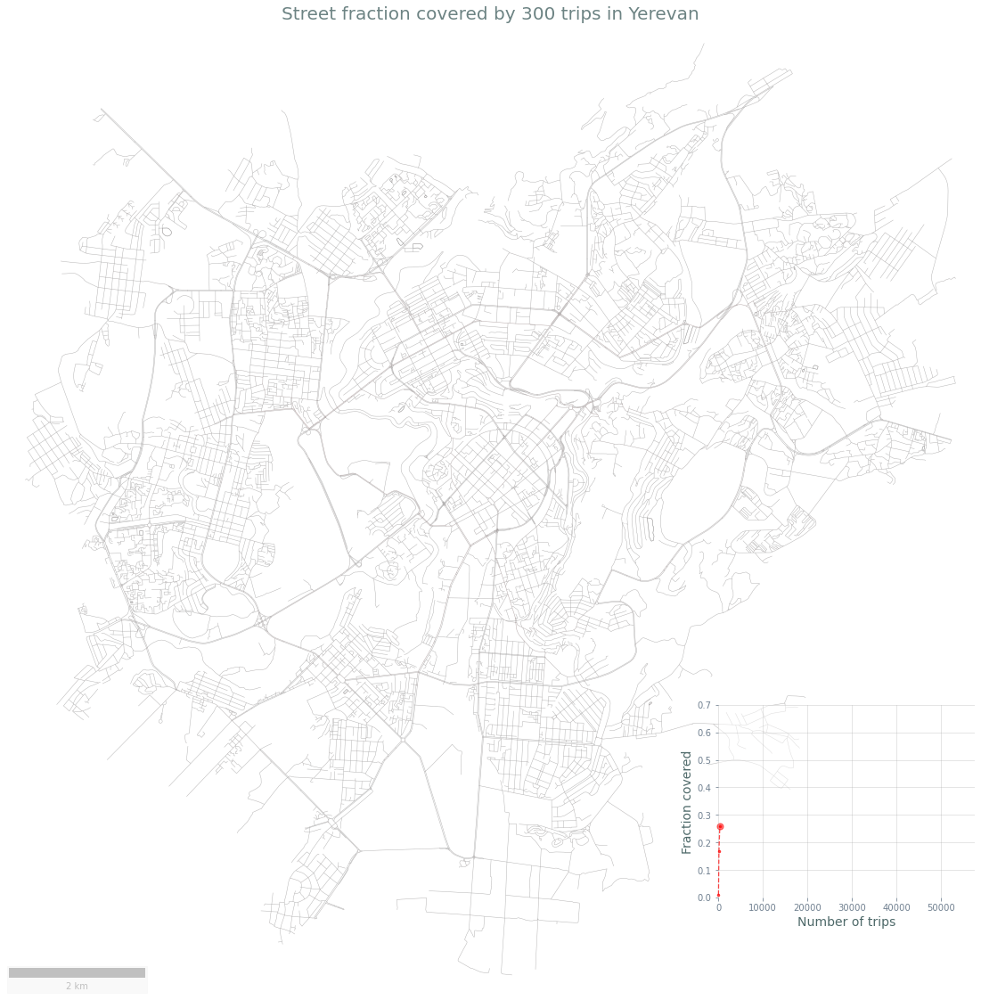

3it [00:17,  5.69s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 982665.95it/s]


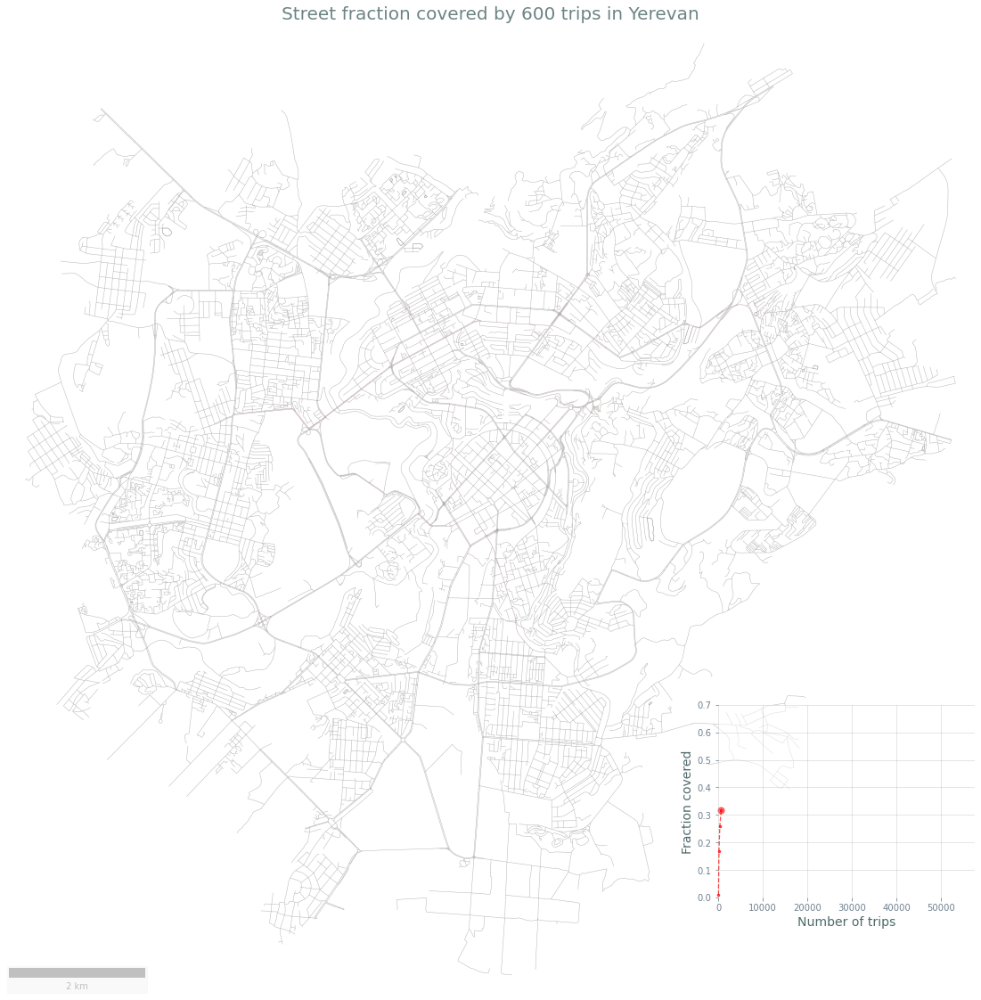

4it [00:22,  5.69s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 708963.72it/s]


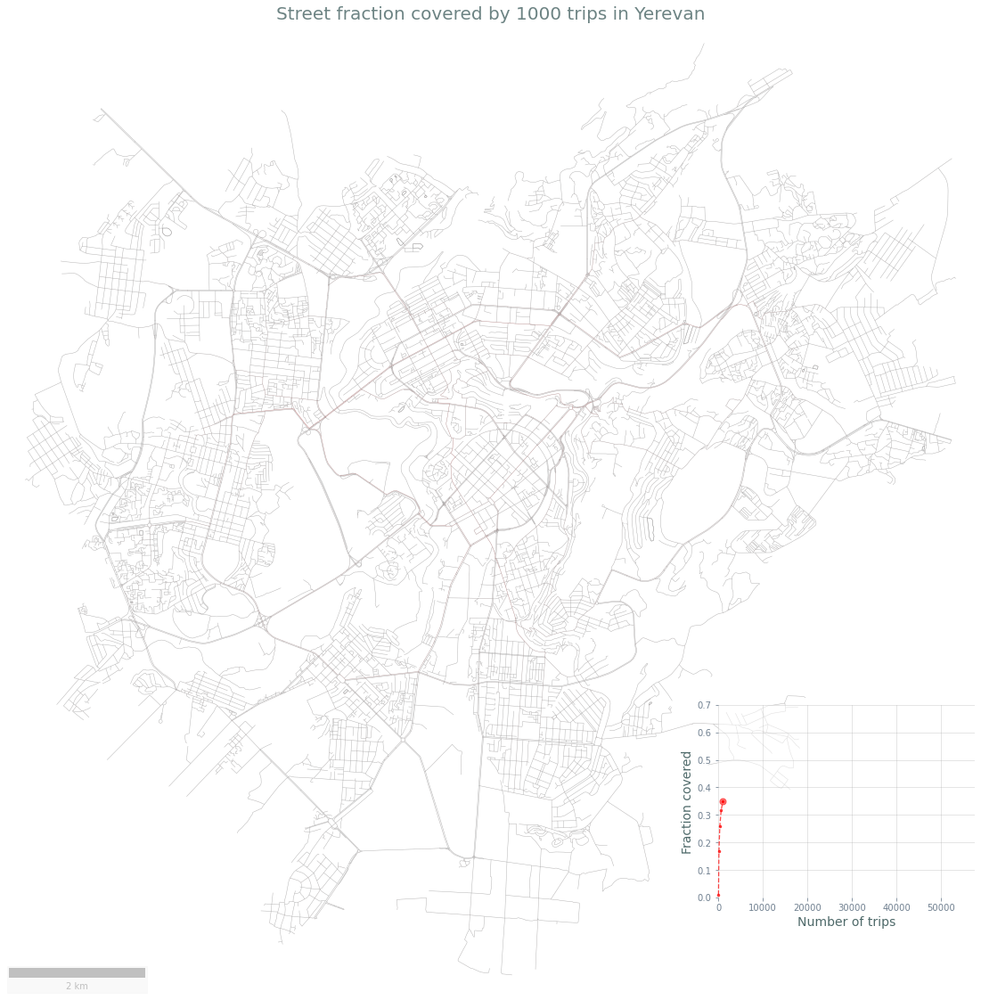

5it [00:28,  5.64s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 911597.20it/s]


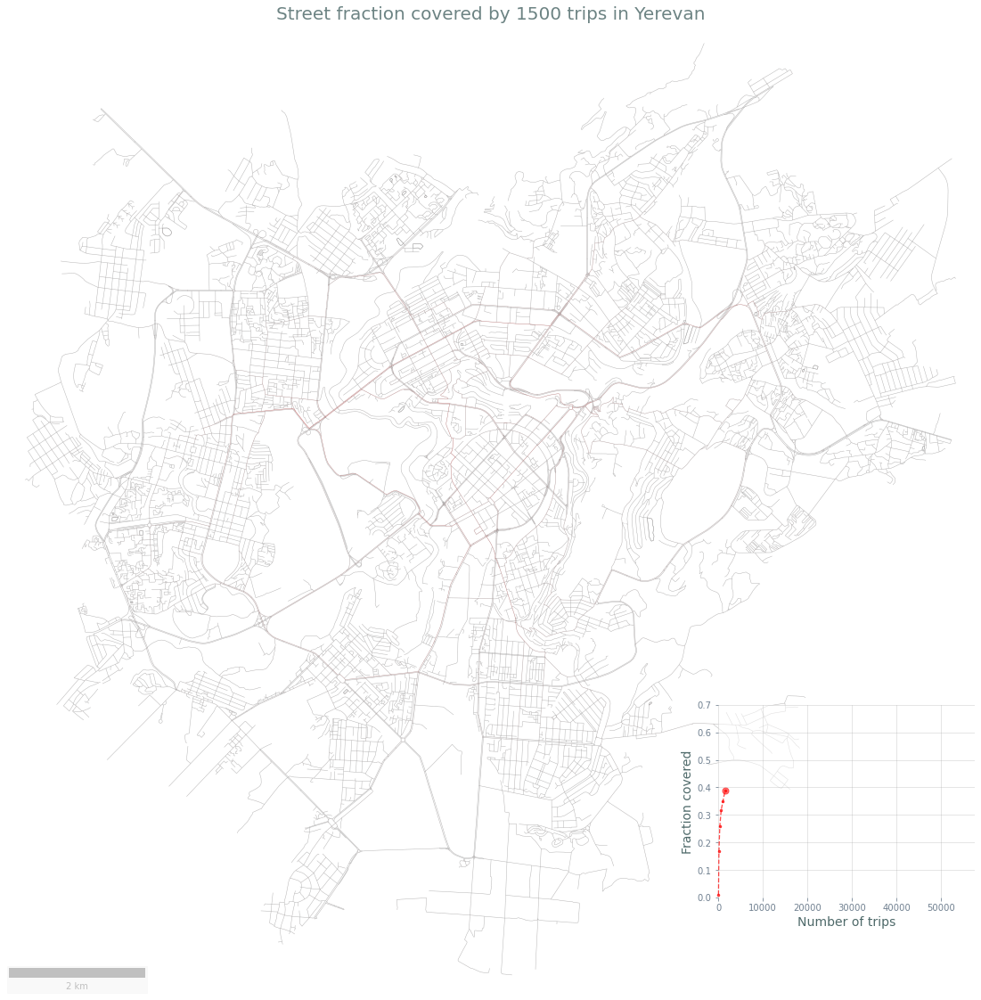

6it [00:33,  5.65s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 912809.37it/s]


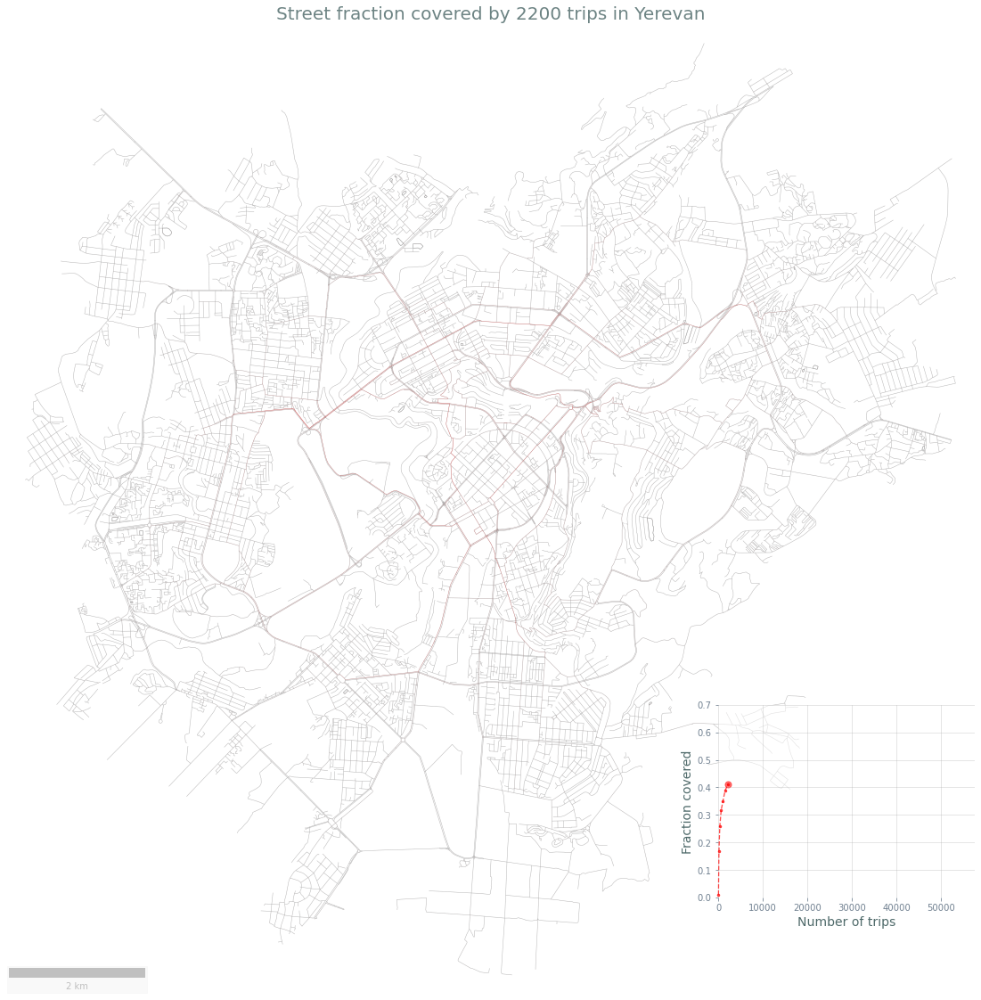

7it [00:39,  5.66s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 671673.71it/s]


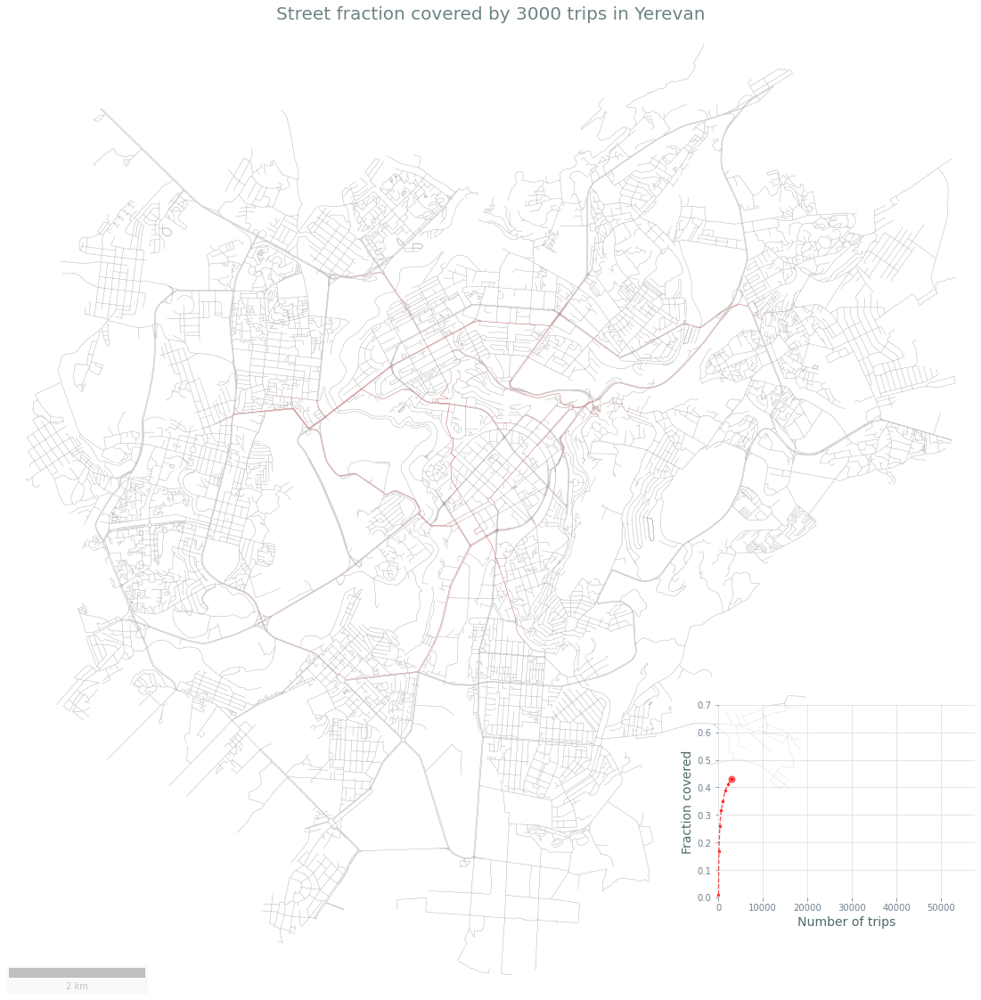

8it [00:45,  5.63s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 850952.51it/s]


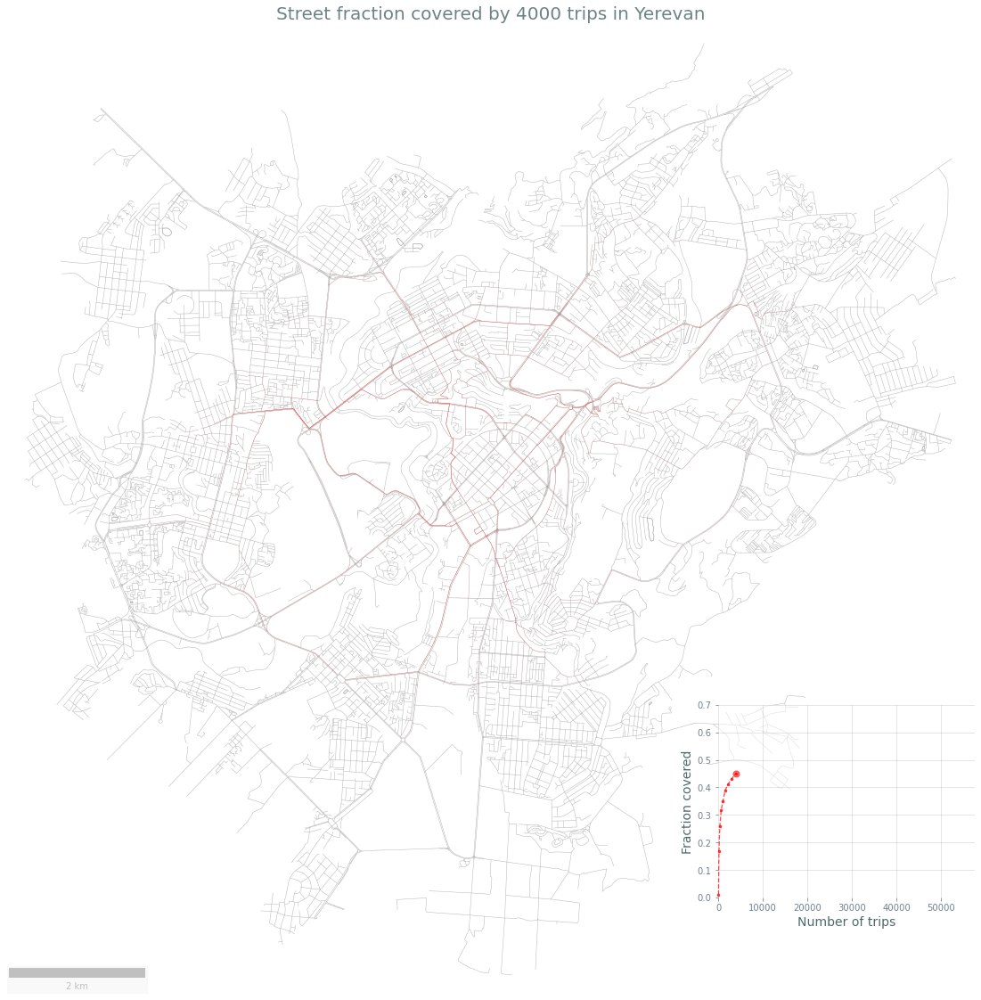

9it [00:50,  5.61s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 912373.86it/s]


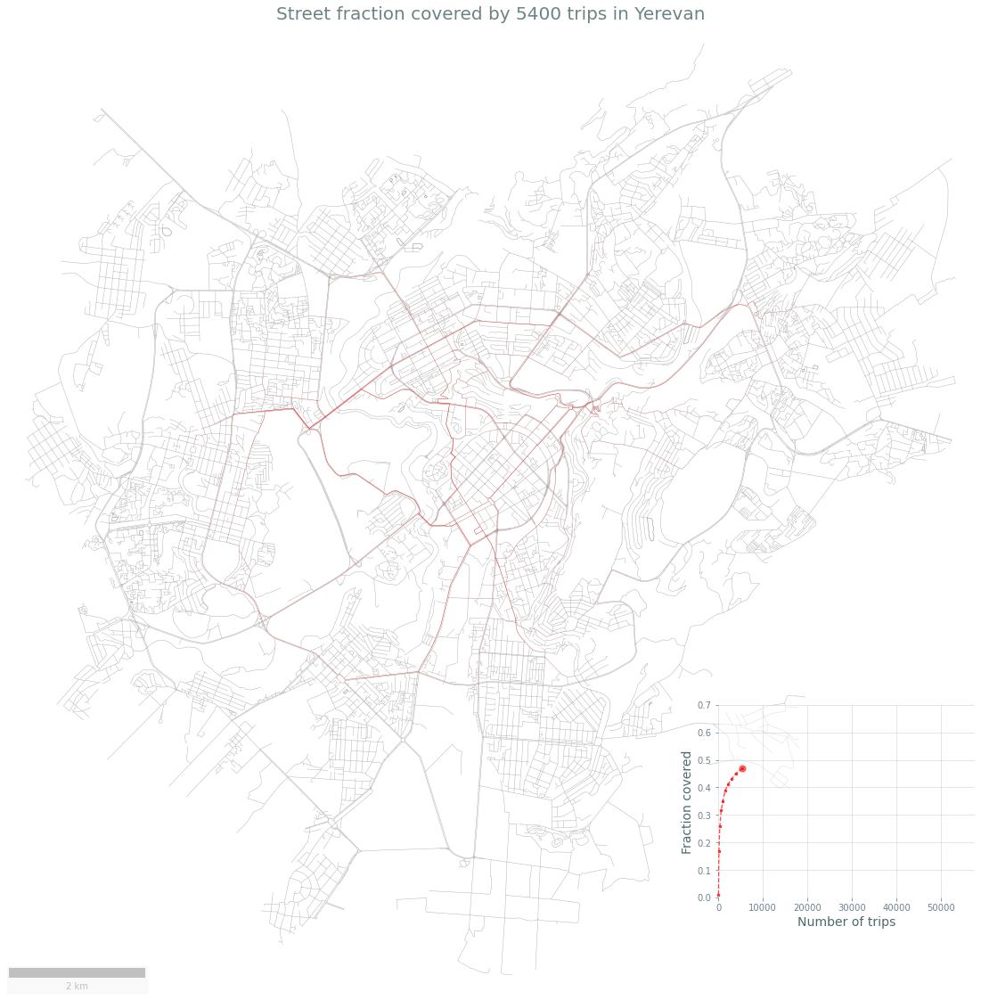

10it [00:56,  5.59s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 638156.07it/s]


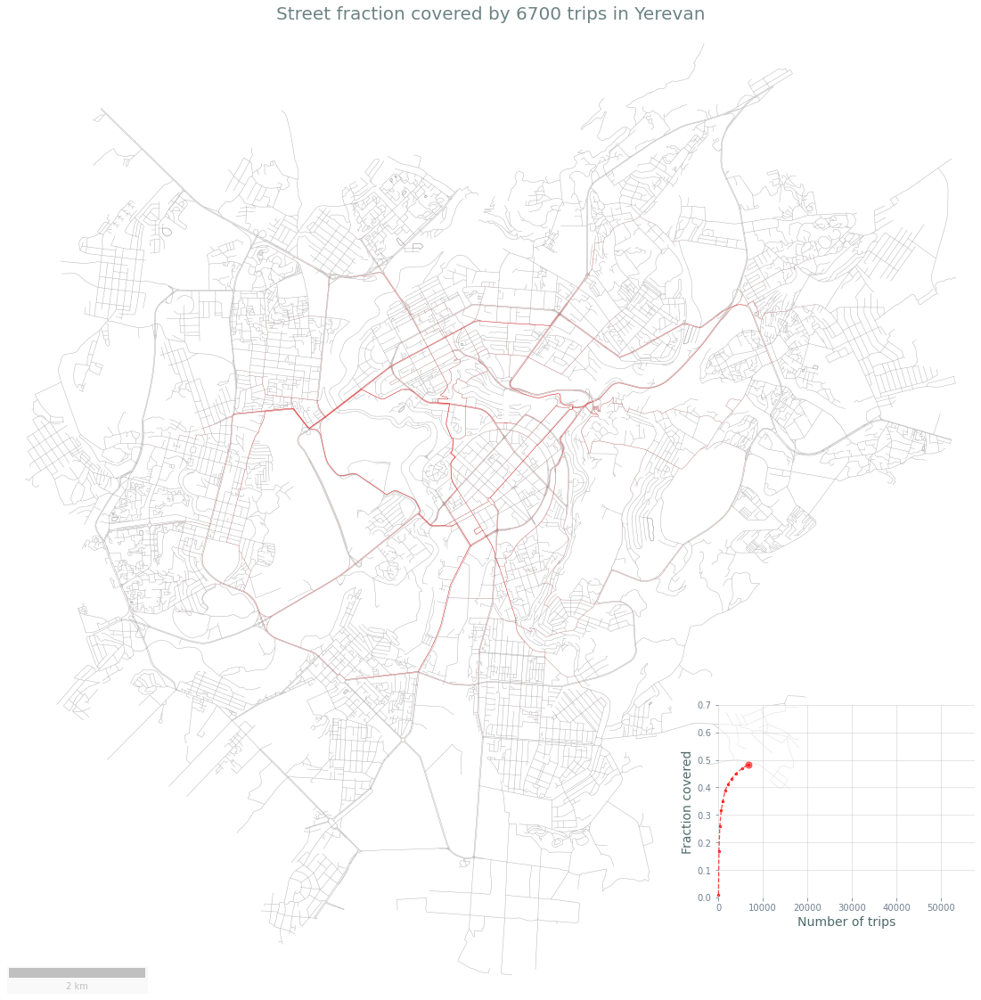

11it [01:02,  5.63s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 385719.94it/s]


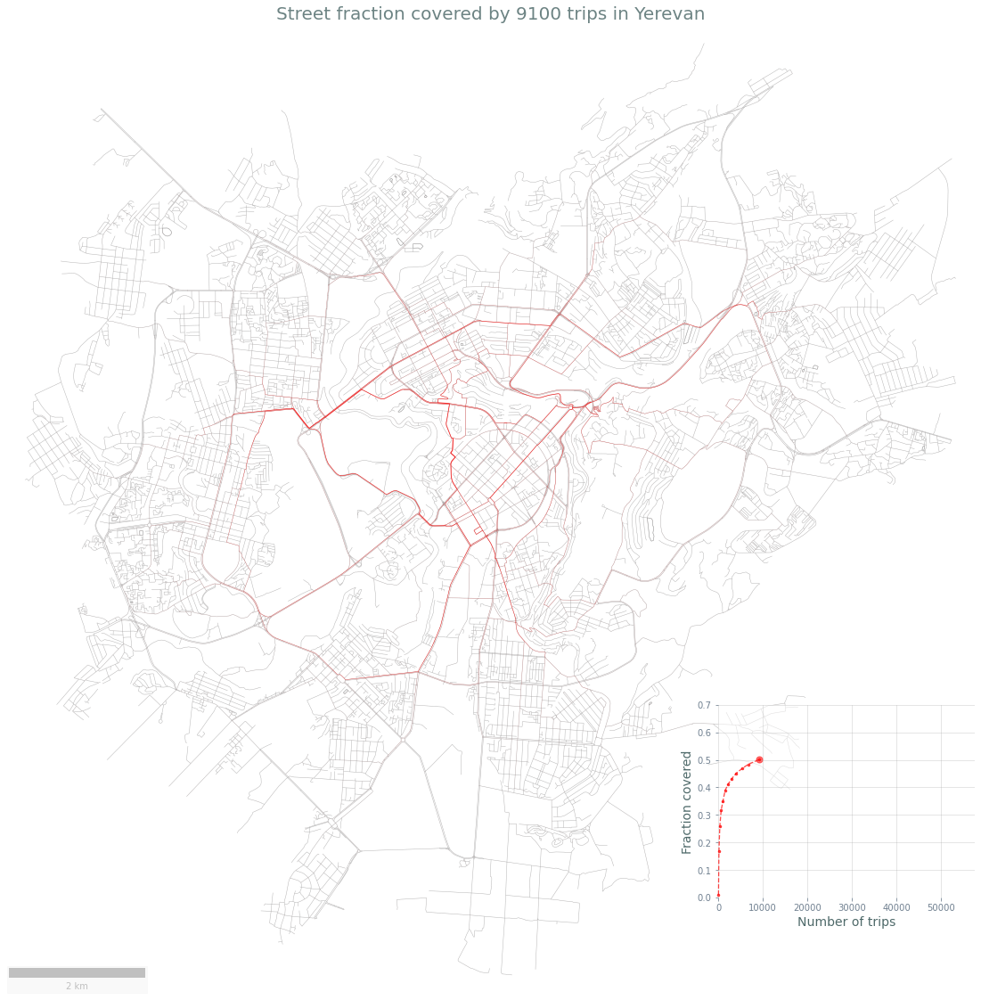

12it [01:08,  5.77s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 672432.87it/s]


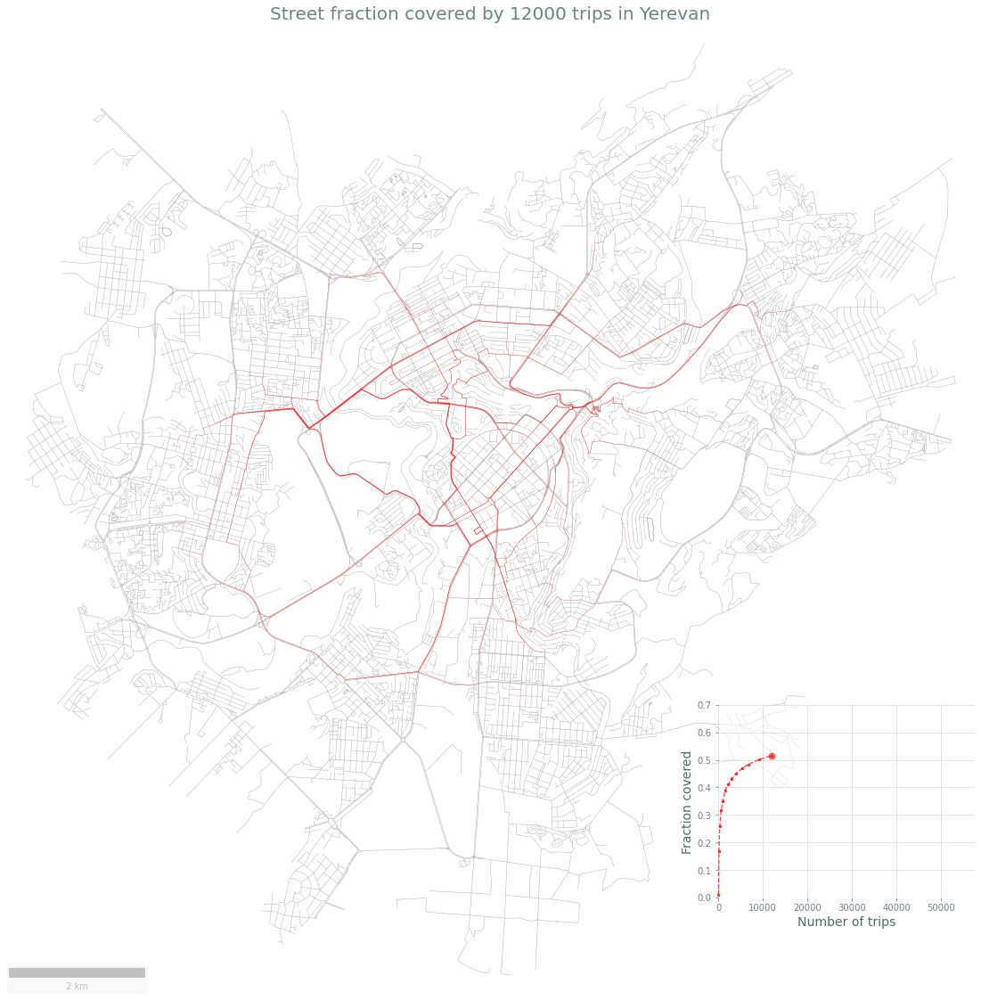

13it [01:14,  5.85s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 850871.38it/s]


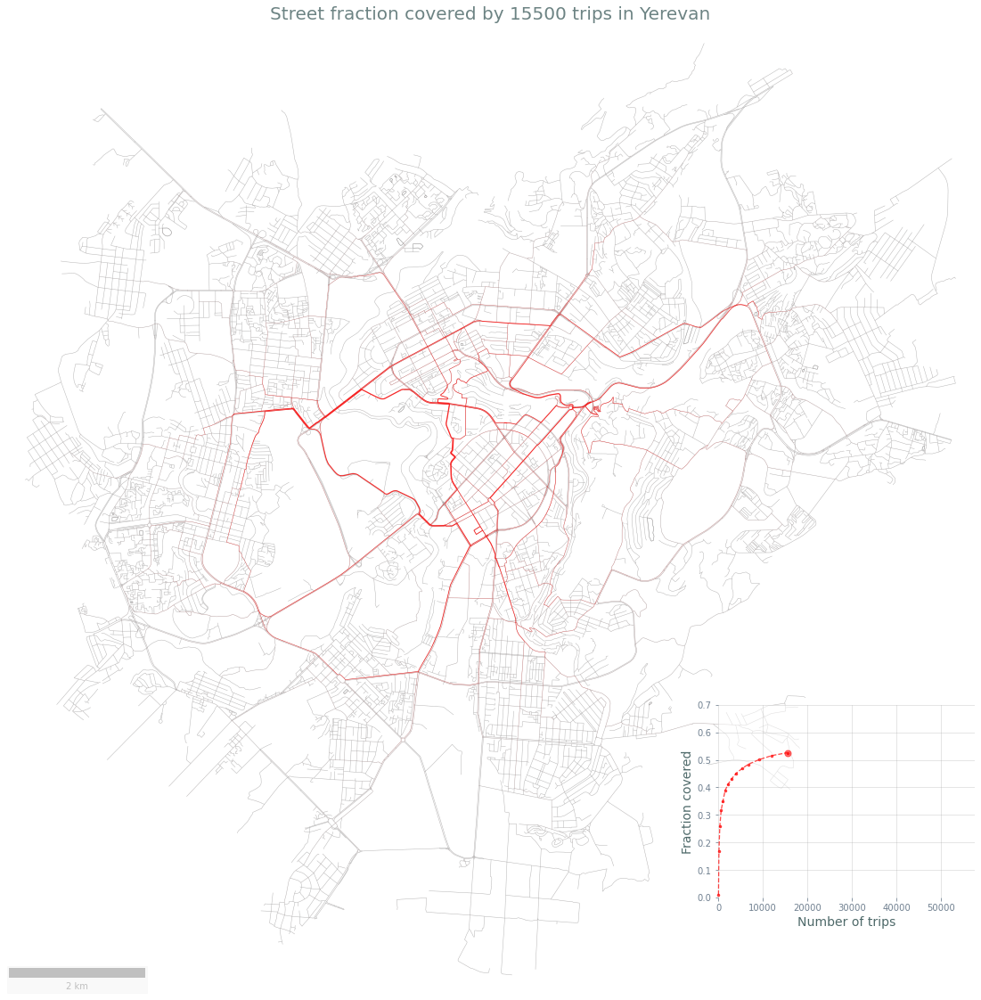

14it [01:20,  5.90s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 798075.55it/s]


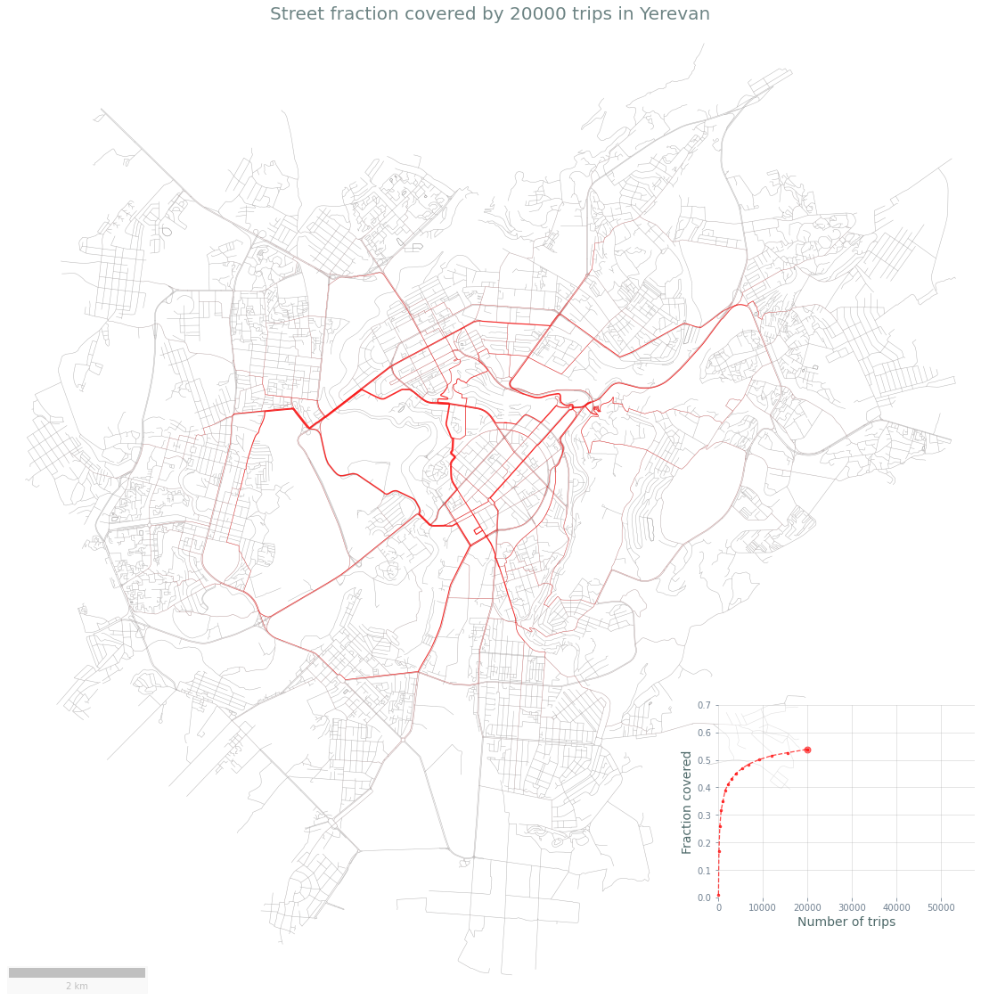

15it [01:26,  6.00s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 797445.60it/s]


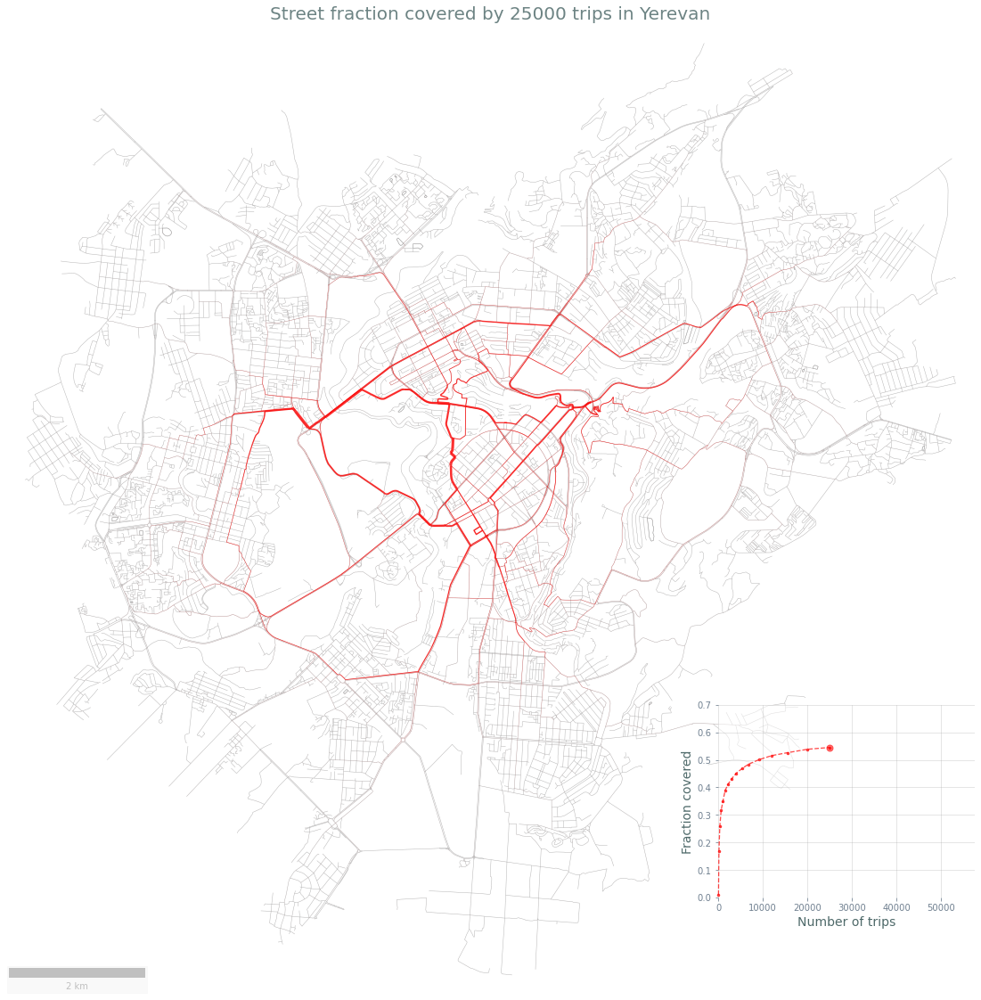

16it [01:32,  6.10s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 851439.64it/s]


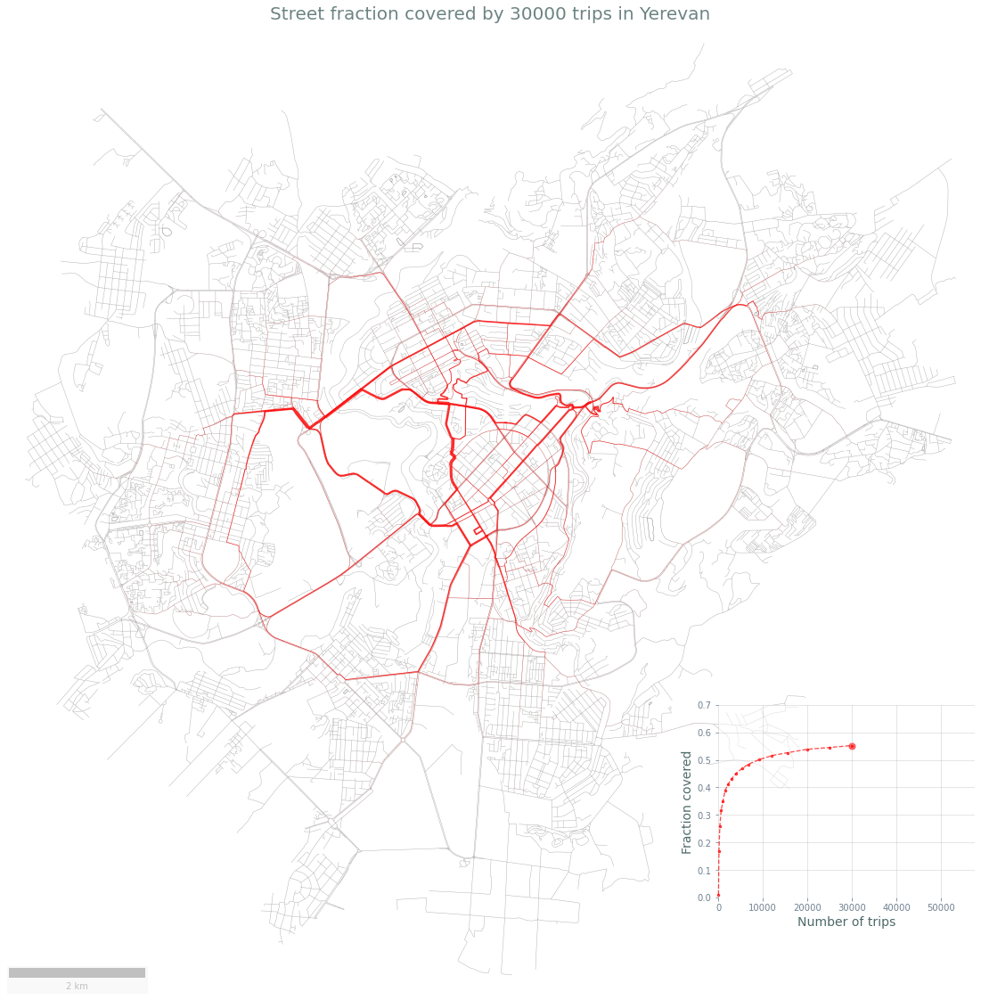

17it [01:39,  6.22s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 682051.91it/s]


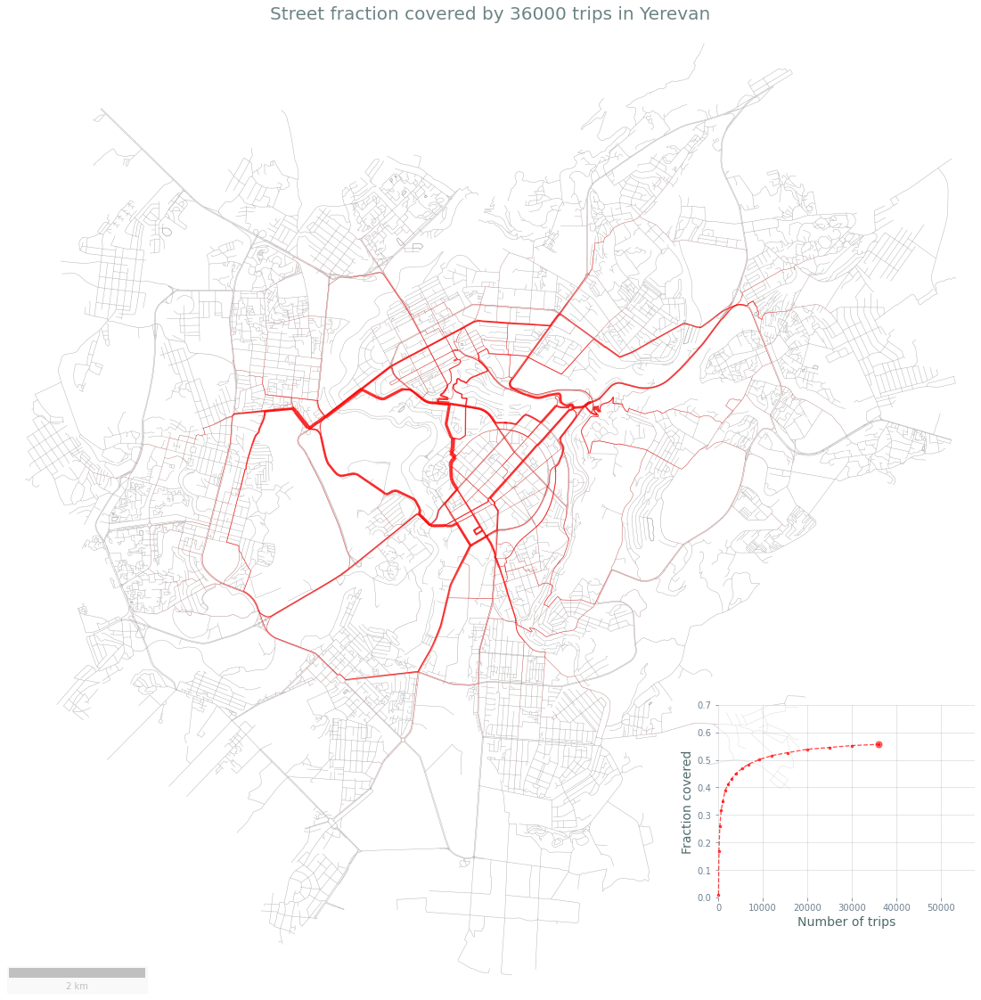

18it [01:45,  6.37s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 580170.17it/s]


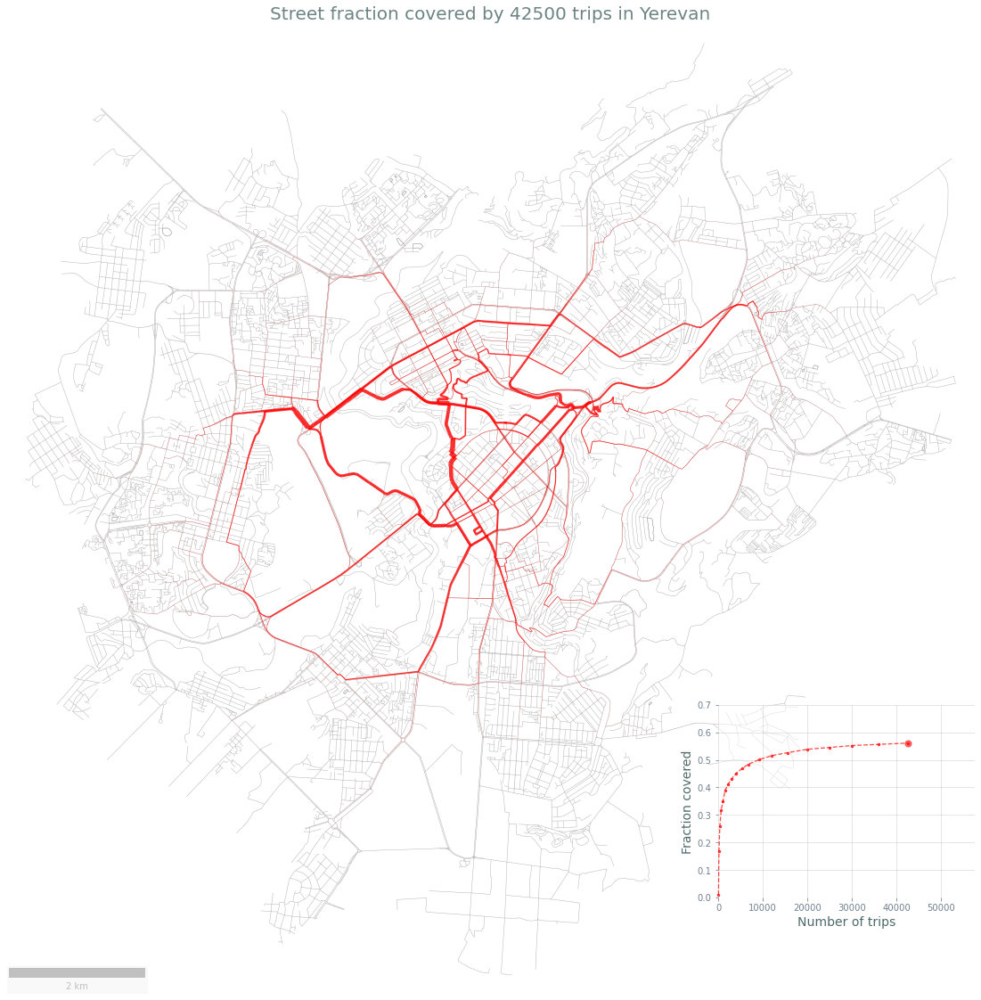

19it [01:53,  6.68s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 797635.67it/s]


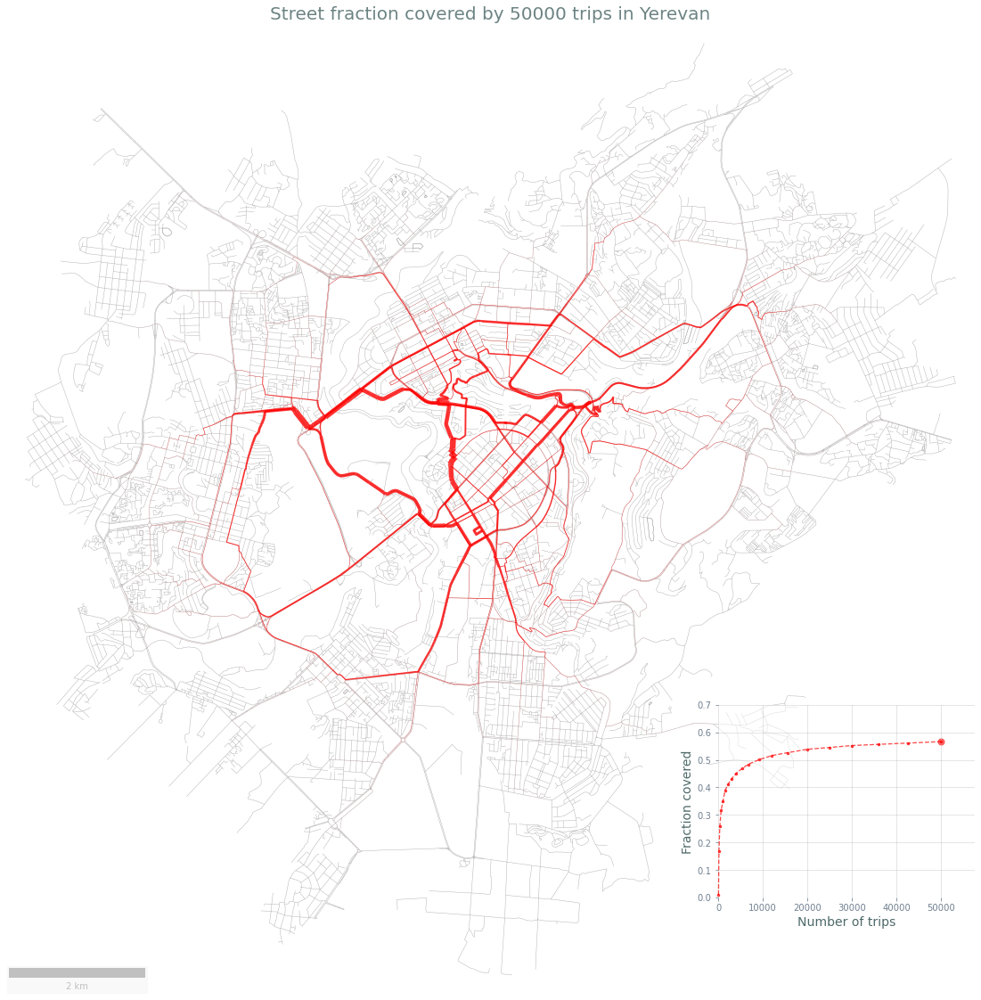

20it [02:00,  6.83s/it]
100%|██████████████████████████████████████████████████████████████████████| 12766/12766 [00:00<00:00, 523549.80it/s]


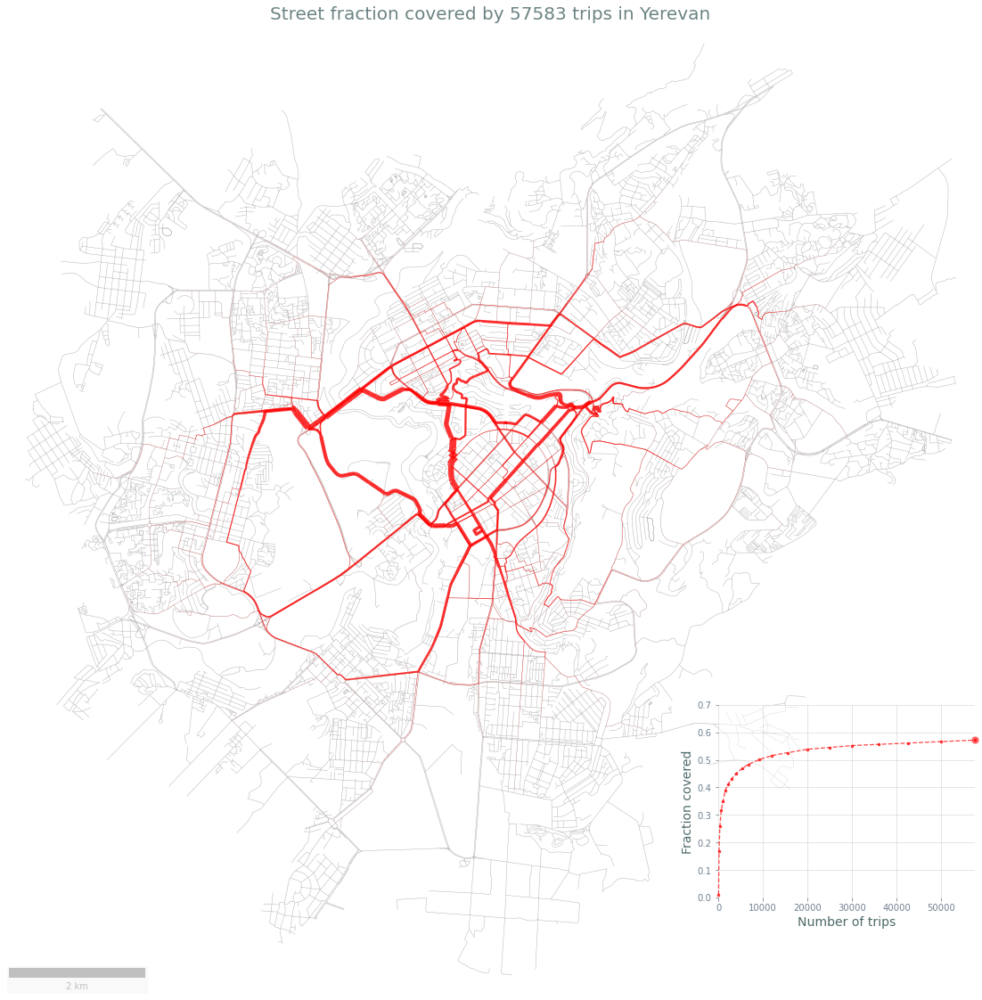

21it [02:08,  6.10s/it]

time: 2min 8s (started: 2021-09-26 21:56:04 +01:00)


In [15]:
import random
from matplotlib_scalebar.scalebar import ScaleBar

# loop over the different amounts of trips
for n, trip in tqdm(enumerate(trips)):
    
    # for each amount of trips, take streets corresponding up to that many trips
    trip_streets = street_list[:trip]
    # flatten list
    trip_streets_flat = [item for sublist in trip_streets for item in sublist]
    # apply the sort_tuples function to get rid of reversed tuples
    trip_streets_corr = sort_tuples(trip_streets_flat)
    # create a dictionary of street counts
    street_counts = dict(Counter(trip_streets_corr))
    
    # initialise empty dictionary to collect the edge thicknesses
    edge_thickness = []
    # loop over streets in the Yerevan street network
    for street in tqdm(yerevan_streets):
        # check if the tuple representing that street is present in the street count dictionary
        if street in street_counts: 
            edge_thickness.append(street_counts[street])
        # if not, check whether the reversed tuple is present
        elif street[::-1] in street_counts:
            edge_thickness.append(street_counts[street[::-1]])
        # if none of them are present, assign a thickness of 1
        else:
            edge_thickness.append(1)
    edge_thickness = np.array(edge_thickness)
    
    # plot
    plot_(yerevan_subgraph, figsize=(20,20), node_size=0,
                                  bgcolor='white',
                                  edge_linewidth=edge_thickness/1000,
                                  edge_alpha=0.7,
                                  edge_color="#999999")
    

Now let's create a function that sorts our plots in correct order so we can then create the animated spatial visualisation.

In [16]:
import re
def sorted_nicely( l ):
    """ Sorts the given iterable in the way that is expected.
 
    Required arguments:
    l -- The iterable to be sorted.
 
    """
    convert = lambda text: int(text) if text.isdigit() else text
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(l, key = alphanum_key)

from os import listdir
filenames = listdir('../Notebooks/plots/Urban Sensing/')
filenames = sorted_nicely(filenames)
filenames

['Yerevan_coverage_1.jpg',
 'Yerevan_coverage_2.jpg',
 'Yerevan_coverage_3.jpg',
 'Yerevan_coverage_4.jpg',
 'Yerevan_coverage_5.jpg',
 'Yerevan_coverage_6.jpg',
 'Yerevan_coverage_7.jpg',
 'Yerevan_coverage_8.jpg',
 'Yerevan_coverage_9.jpg',
 'Yerevan_coverage_10.jpg',
 'Yerevan_coverage_11.jpg',
 'Yerevan_coverage_12.jpg',
 'Yerevan_coverage_13.jpg',
 'Yerevan_coverage_14.jpg',
 'Yerevan_coverage_15.jpg',
 'Yerevan_coverage_16.jpg',
 'Yerevan_coverage_17.jpg',
 'Yerevan_coverage_18.jpg',
 'Yerevan_coverage_19.jpg',
 'Yerevan_coverage_20.jpg',
 'Yerevan_coverage_21 - Copy - Copy - Copy - Copy.jpg',
 'Yerevan_coverage_21 - Copy - Copy - Copy.jpg',
 'Yerevan_coverage_21 - Copy - Copy.jpg',
 'Yerevan_coverage_21 - Copy.jpg',
 'Yerevan_coverage_21.jpg']

time: 0 ns (started: 2021-09-26 21:58:12 +01:00)


In [17]:
import imageio
with imageio.get_writer('Yerevan_sensing_power.gif', mode='I',fps=7) as writer:
    for filename in tqdm(filenames):
        image = imageio.imread('../Notebooks/plots/Urban Sensing/{}'.format(filename))
        writer.append_data(image)

100%|████████████████████████████████████████████████████████████████████████████████| 25/25 [00:12<00:00,  2.04it/s]

time: 12.3 s (started: 2021-09-26 21:58:12 +01:00)


## Conclusion

Of course there are many implicit assumptions and scenarios not considered in this study. For instance, we considered $\mathcal{T}$ to be one day, that is a segment is considered as covered if it is covered at least once by a vehicle from $\mathcal{V}$ during one day. This is for many sensing purposes too coarse a temporal resolution. For a discussion of finer temporal resolutions, feel free to read the original study. 
Further, since taxis are concentrated in commercial and touristic neighbourhoods, taxi-based urban sensing displays an inherent spatial bias. This bias could have negative effects, such as underscanning socioeconomically disadvantaged neighborhoods. To overcome this, a hybrid approach to sensing could be attempted. Further yet, our analysis has focused on the fraction of raw segments covered: $C=\sum 1_{\left(M_{i} \geq 1\right)}$. A more accurate approach would have been to consider the lengths $b_i$ of the road segments: $C=\sum b_{i} 1_{\left(M_{i} \geq 1\right)}$.

Despite these and other shortcomings, this work has shown the great potential of taxi-based urban sensing. It will furnish urban practitioners with large amounts of useful data and make possible the development of effective monitoring tools. We have revealed this to be possible with a surprisingly small numbers of sensors.

## Final Project Part II

Carry out the above analysis and visualisation for the city you selected for Part I of the Final Project.

Complete the task in a clean Jupyter Notebook, name the notebook **< Name > < Surname > Final Project Part II** and upload it **along with the final GIF** to Moodle.